# Predict CLTV of a customer


## Problem Statement

VahanBima is one of the leading insurance companies in India. It provides motor vehicle insurances at best prices with 24/7 claim settlement.  It offers different types of policies for  both personal and commercial vehicles. It has established its brand across different regions in India. 

Around 90% of the businesses today use personalized services. The company wants to launch different personalized experience programs for customers of VahanBima. The personalized experience can be dedicated resources for claim settlement, different kinds of services at doorstep, etc. Inorder to do so, they would like to segment the customers into different tiers based on their customer lifetime value (CLTV).

Inorder to do it, they would like to predict the customer lifetime value based on the activity and interaction of the customer with the platform. So, as a part of this challenge, your task at hand is to build a high performance and interpretable machine learning model to predict the CLTV based on the user and policy data.

## About the Dataset



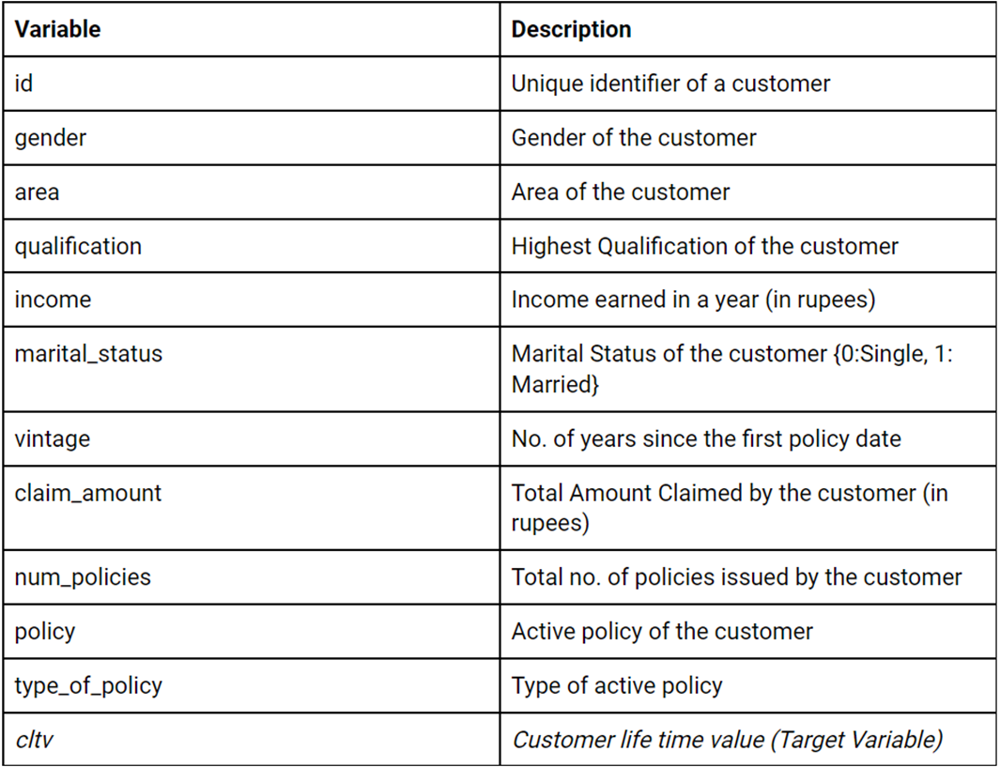

## Import Libraries

In [244]:
#Data manipulation
import pandas  as pd 
import numpy as np 

# Visualization
import matplotlib.pyplot as plt 
import seaborn as sns 
import plotly.express as px

# Outlier Treatmment
from scipy.stats.mstats import winsorize
# Feature scaling
from sklearn.preprocessing import MinMaxScaler

# using gridserchcv to find best params
from sklearn.model_selection import ShuffleSplit,GridSearchCV,RandomizedSearchCV

# Train test split
from sklearn.model_selection import train_test_split

# Modelling
from sklearn.linear_model import LinearRegression,Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import  RandomForestRegressor,AdaBoostRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR

# Model Evaluation
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score,roc_auc_score

import warnings
warnings.filterwarnings('ignore')

## Data gathering

In [181]:
original_train_df = pd.read_csv('Data/train_BRCpofr.csv')

In [182]:
# creating copy to perform feature engineering in later stage
train_df = original_train_df.copy()

In [171]:
train_df.head()

,id,gender,area,qualification,income,marital_status,vintage,claim_amount,num_policies,policy,type_of_policy,cltv
0,1,Male,Urban,Bachelor,5L-10L,1,5,5790,More than 1,A,Platinum,64308
1,2,Male,Rural,High School,5L-10L,0,8,5080,More than 1,A,Platinum,515400
2,3,Male,Urban,Bachelor,5L-10L,1,8,2599,More than 1,A,Platinum,64212
3,4,Female,Rural,High School,5L-10L,0,7,0,More than 1,A,Platinum,97920
4,5,Male,Urban,High School,More than 10L,1,6,3508,More than 1,A,Gold,59736


In [172]:
test_df.head()

,id,gender,area,qualification,income,marital_status,vintage,claim_amount,num_policies,policy,type_of_policy
0,89393,Female,Rural,High School,5L-10L,0,6,2134,More than 1,B,Silver
1,89394,Female,Urban,High School,2L-5L,0,4,4102,More than 1,A,Platinum
2,89395,Male,Rural,High School,5L-10L,1,7,2925,More than 1,B,Gold
3,89396,Female,Rural,Bachelor,More than 10L,1,2,0,More than 1,B,Silver
4,89397,Female,Urban,High School,2L-5L,0,5,14059,More than 1,B,Silver


## Exploratory data analysis

In [173]:
print("Shape of train dataset: ",train_df.shape)
print("Shape of test dataset: ",test_df.shape)

Shape of train dataset:  (89392, 12)
Shape of test dataset:  (59595, 11)


In [174]:
print("Columns in train dataset:\n ",train_df.columns.to_list())
print("*"*80)
print("Columns in test dataset:\n ",test_df.columns.to_list())

Columns in train dataset:
  ['id', 'gender', 'area', 'qualification', 'income', 'marital_status', 'vintage', 'claim_amount', 'num_policies', 'policy', 'type_of_policy', 'cltv']
********************************************************************************
Columns in test dataset:
  ['id', 'gender', 'area', 'qualification', 'income', 'marital_status', 'vintage', 'claim_amount', 'num_policies', 'policy', 'type_of_policy']


In [175]:
print("Input fetaures:\n ",train_df.drop('cltv',axis=1).columns.to_list())
print("Target fetaure:\n ",train_df['cltv'].name)

Input fetaures:
  ['id', 'gender', 'area', 'qualification', 'income', 'marital_status', 'vintage', 'claim_amount', 'num_policies', 'policy', 'type_of_policy']
Target fetaure:
  cltv


In [176]:
#Check datatypes of columns
train_df.dtypes

id                 int64
gender            object
area              object
qualification     object
income            object
marital_status     int64
vintage            int64
claim_amount       int64
num_policies      object
policy            object
type_of_policy    object
cltv               int64
dtype: object

In [177]:
# statistical measures of continuous columns
train_df.describe()

,id,marital_status,vintage,claim_amount,cltv
count,89392.000000,89392.000000,89392.000000,89392.000000,89392.000000
mean,44696.500000,0.575488,4.595669,4351.502416,97952.828978
std,25805.391969,0.494272,2.290446,3262.359775,90613.814793
min,1.000000,0.000000,0.000000,0.000000,24828.000000
25%,22348.750000,0.000000,3.000000,2406.000000,52836.000000
50%,44696.500000,1.000000,5.000000,4089.000000,66396.000000
75%,67044.250000,1.000000,6.000000,6094.000000,103440.000000
max,89392.000000,1.000000,8.000000,31894.000000,724068.000000


In [178]:
# checking null values
train_df.isnull().sum()

id                0
gender            0
area              0
qualification     0
income            0
marital_status    0
vintage           0
claim_amount      0
num_policies      0
policy            0
type_of_policy    0
cltv              0
dtype: int64

In [179]:
# unique values in each column
train_df.nunique()

id                89392
gender                2
area                  2
qualification         3
income                4
marital_status        2
vintage               9
claim_amount      10889
num_policies          2
policy                3
type_of_policy        3
cltv              18796
dtype: int64

In [183]:
# dropping id column as it is just index does not impart any value to the prediction of target
train_df.drop(columns=['id'],axis=1,inplace=True)

###### Below are initial inferences from our data

- There are 89392 Observations of 12 Variable
- There are mix of categorical and continous DataType.
- Dependent Variable is Customer Life Time Value as we have to predict the CLTV.
- Dependent variable is continuous so this is a regression problem
- Categorical Independent Variables are: ['gender', 'area', 'qualification', 'income', 'num_policies', 'policy', 'type_of_policy']
- Continues Independed Variables are : ['id', 'marital_status', 'vintage', 'claim_amount']
- There are no null values, so no further action required to replace missing or null values.
- “id” column is serial number so it is insignificant for analysis and removed from the dataset.

### Univariate Analysis

- Examine each variable individually
- for categorical columns plot frequency table or bar graph
- for numerical columns plot distribution graphs

#### Target : CLTV

Customer lifetime value (CLV) is a measure of the total income a business can expect to bring in from a typical customer for as long as that person or account remains a client. When measuring CLV, it's best to look at the total average revenue generated by a customer and the total average profit.

In [14]:
#target variable
train_df['cltv'].describe()

count     89392.000000
mean      97952.828978
std       90613.814793
min       24828.000000
25%       52836.000000
50%       66396.000000
75%      103440.000000
max      724068.000000
Name: cltv, dtype: float64

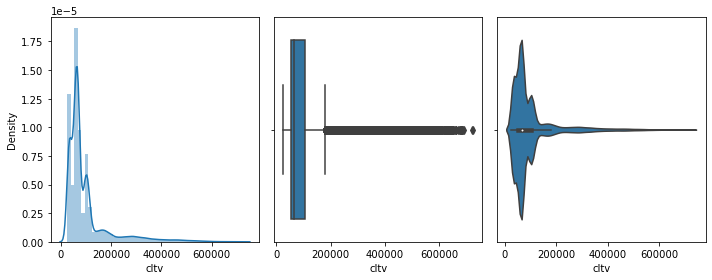

In [15]:
plt.figure(figsize=(10,4))
plt.subplot(1,3,1)
sns.distplot(train_df['cltv'],kde=True)
plt.subplot(1,3,2)
sns.boxplot(train_df['cltv'])
plt.subplot(1,3,3)
sns.violinplot(train_df['cltv'])
plt.tight_layout()
plt.show()

- The CLTV is concentrated below 100,000 thats means based on the customer base, Our firm can expect on an average 70k - 1lakh income business per customer
- There are a lot of Customers with low CLV. Very few customers with high CLV.

###### Grouping data according to their datatypes for graphical analysis

In [184]:
def check_variable_types(data):
    #target columns
    tar_col = ['cltv']

    #categorical features
    obj_cols = data.drop(tar_col,axis=1).select_dtypes(exclude=np.number).columns.to_list()
    cat_cols = []
    ord_cols = []

    for col in obj_cols:
        if data[col].value_counts().shape[0] == 2:
            cat_cols.append(col)
        elif data[col].value_counts().shape[0] > 2:
            ord_cols.append(col)

    #numerical features
    num_cols = data.drop(tar_col,axis=1).select_dtypes(include=np.number).columns.to_list()
    suspected_cat_cols = []

    #checking if any is categorial 
    for col in num_cols:
        if data[col].value_counts().shape[0] <= 5:
            print("Column name: ",col)
            print(data[col].value_counts())
            suspected_cat_cols.append(col)
            
    return tar_col,cat_cols,ord_cols,num_cols,suspected_cat_cols
    
tar_cols,cat_cols,ord_cols,num_cols,sus_cols = check_variable_types(train_df)

print("target Columns: ",tar_cols)
print("*"*80)
print("Categorical Columns: ",cat_cols)
print("*"*80)
print("Ordinal Columns: ",ord_cols)
print("*"*80)
print("Numerical cols: ",num_cols)
print("*"*80)
print("Suspected Categorical cols: ",sus_cols)

Column name:  marital_status
1    51444
0    37948
Name: marital_status, dtype: int64
target Columns:  ['cltv']
********************************************************************************
Categorical Columns:  ['gender', 'area', 'num_policies']
********************************************************************************
Ordinal Columns:  ['qualification', 'income', 'policy', 'type_of_policy']
********************************************************************************
Numerical cols:  ['marital_status', 'vintage', 'claim_amount']
********************************************************************************
Suspected Categorical cols:  ['marital_status']


In [185]:
# Marital Status and Vintage is having numerical values but is a categorical feature after 
# checking its value distribution

num_cols.remove('marital_status')
num_cols.remove('vintage')
cat_cols.extend(['marital_status','vintage'])

print("Updated Categorical Columns: ",cat_cols)
print("*"*80)
print("Updated Numerical cols: ",num_cols)

Updated Categorical Columns:  ['gender', 'area', 'num_policies', 'marital_status', 'vintage']
********************************************************************************
Updated Numerical cols:  ['claim_amount']


- Independent features:
    - Binary categorical fetaures -- ['gender', 'area', 'num_policies', 'marital_status', 'vintage']
    - Ordinal categorical features -- ['qualification', 'income', 'policy', 'type_of_policy']
    - Numerical features -- ['claim_amount']
- Dependent features:
    - Numerical feature -- ['cltv']

#### Categorical columns

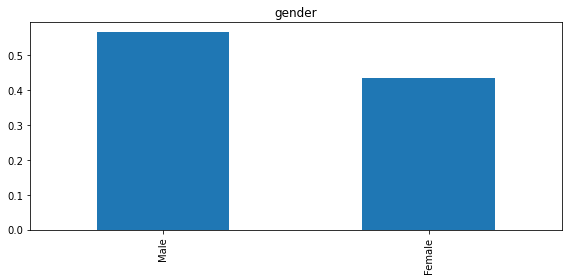

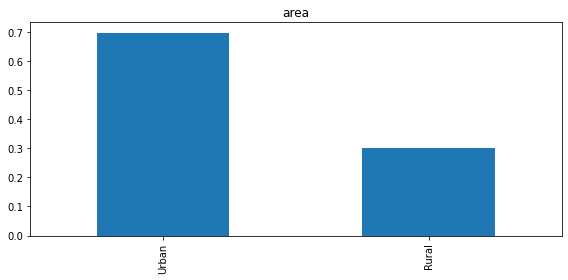

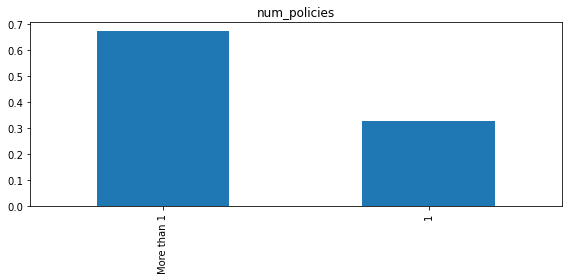

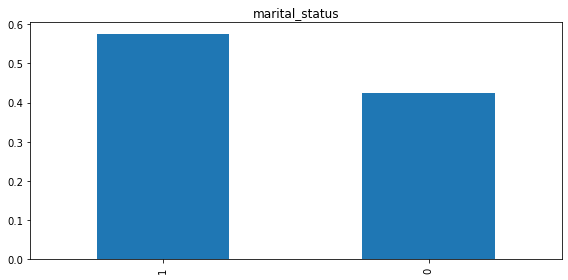

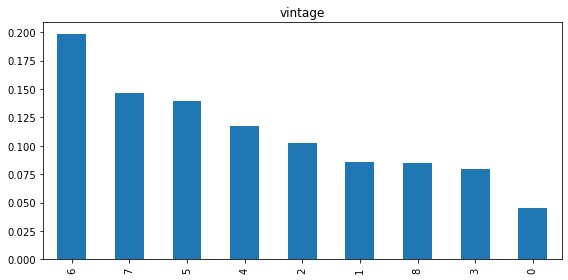

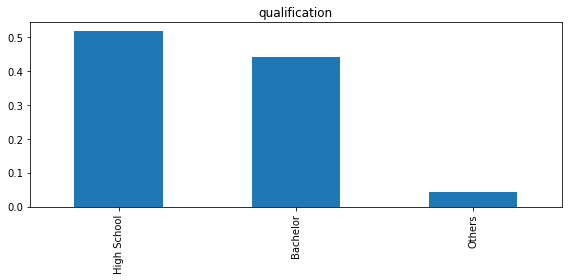

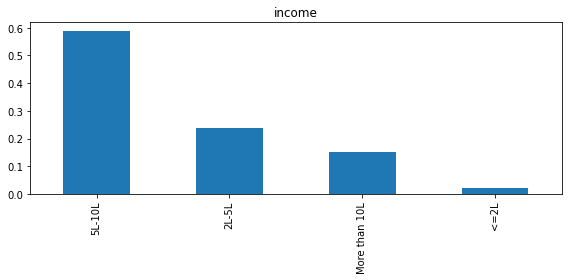

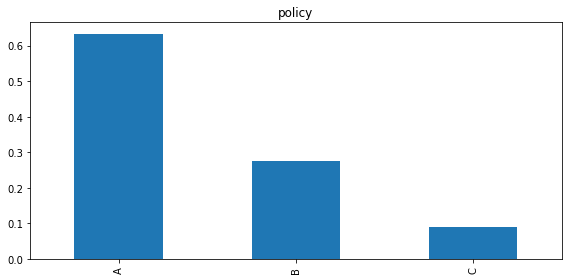

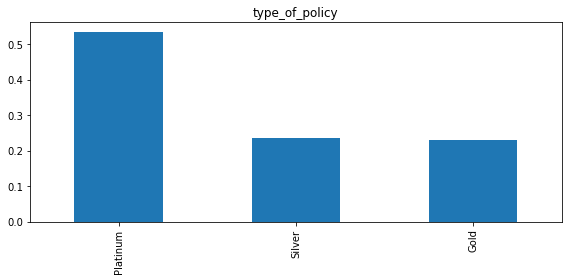

In [186]:
def cat_col_plot(data,cols):
    for col in cols:
        plt.figure(figsize=(8,4))
        data[col].value_counts(normalize=True).plot.bar(title=col)
        plt.tight_layout()
        plt.show()
     

cat_ord_cols = cat_cols + ord_cols

cat_col_plot(train_df,cat_ord_cols)

- Inference
    - Male/Female ratio is almost balanced 60:40.
    - Married/Non-Married ratio is also not that distinguishable.
    - Majority of vintage customers are 6-7 years old since fist policy
    - Around 70% customers are urban population.
    - Most of the customers are having more than 1 policy.
    - Graduates and Non-Graduates have almost equal propotion.
    - Almost 60% customers are in higher income braket.
    - Mostly customer have chossen policy A.
    - Platinum policy is most prefered among customers.

#### numerical columns


<Figure size 720x216 with 0 Axes>

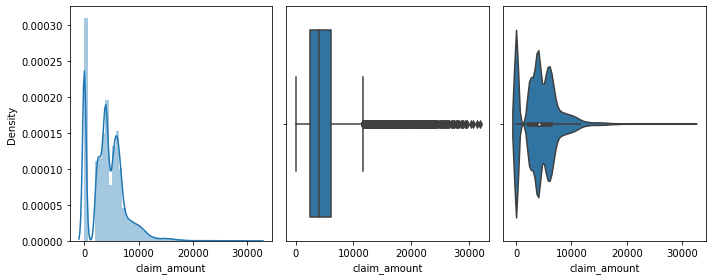

In [19]:
def num_cols_plot(data,cols):
    plt.figure(figsize=(10,3))
    for i in range(0,len(cols)):
        plt.figure(figsize=(10,4))
        plt.subplot(1,3,1)
        sns.distplot(data[cols[i]],kde=True)
        plt.subplot(1,3,2)
        sns.boxplot(data[cols[i]])
        plt.subplot(1,3,3)
        sns.violinplot(data[cols[i]])
        plt.tight_layout()
        plt.show()
    
num_cols_plot(train_df,num_cols)

- Inference
     
    - Claim Amount:
        - DIstribution is right skewed
        - Major distribution is observed below 10,000
        - Some datapoints are extreme indicating one off cases of high claims


### Bivariate Analysis

#### Categorical Independent Variable vs Target Variable

In [197]:
def cat_cols_bivariate_plot(data,col,target):
    plt.figure(figsize=(10,4))
    plt.subplot(131)
    sns.barplot(x=col,y=target,data=data)
    plt.subplot(132)
    sns.violinplot(x=col, y=target, data=data,palette='rainbow')
    plt.subplot(133)
    sns.stripplot(x=col, y=target, data=data)
    plt.tight_layout()
    plt.show()

***Bivariate Analysis for :  gender vs cltv


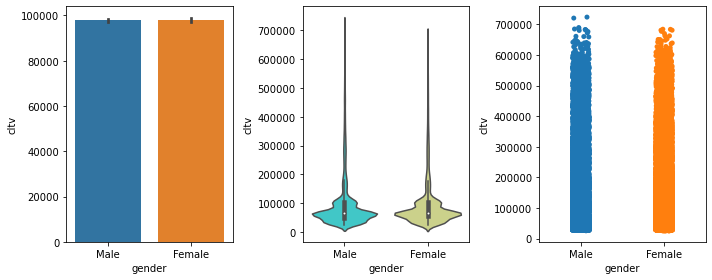

***Bivariate Analysis for :  area vs cltv


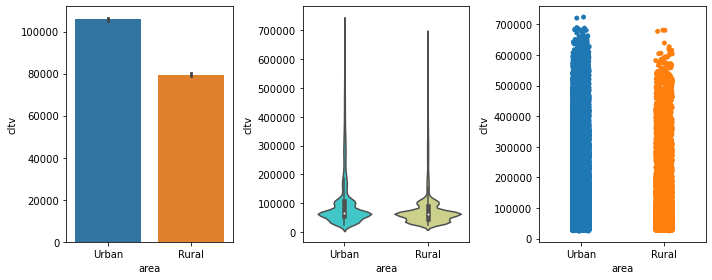

***Bivariate Analysis for :  num_policies vs cltv


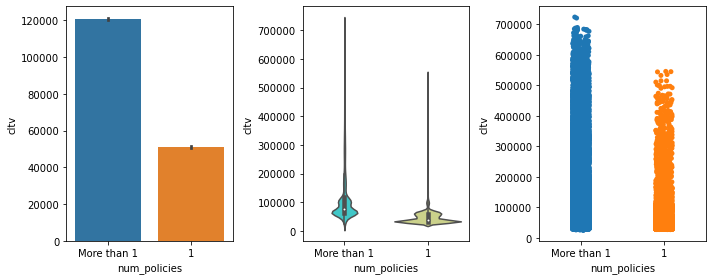

***Bivariate Analysis for :  marital_status vs cltv


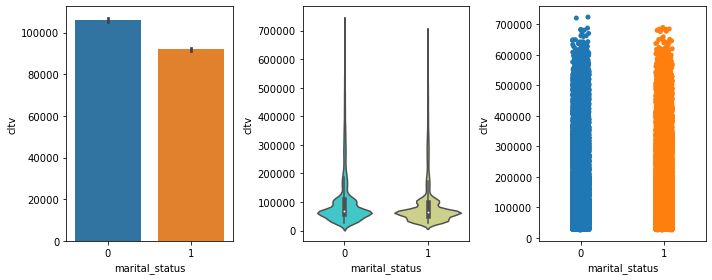

***Bivariate Analysis for :  vintage vs cltv


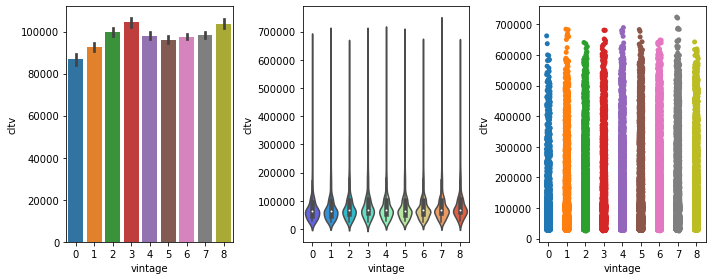

***Bivariate Analysis for :  qualification vs cltv


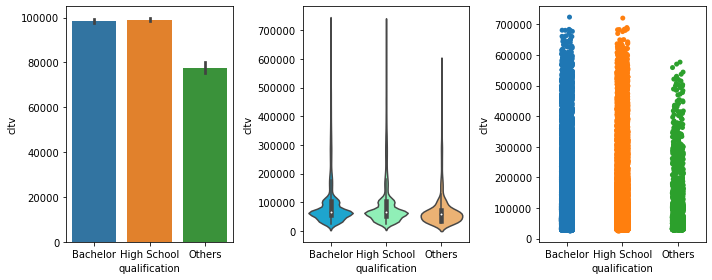

***Bivariate Analysis for :  income vs cltv


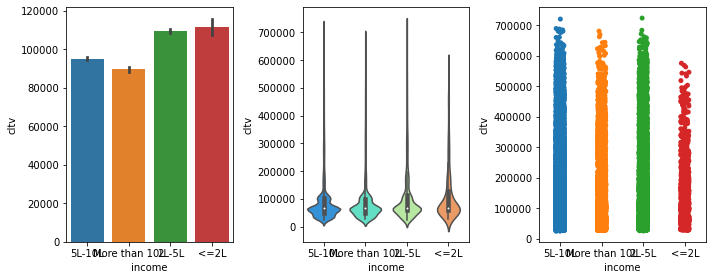

***Bivariate Analysis for :  policy vs cltv


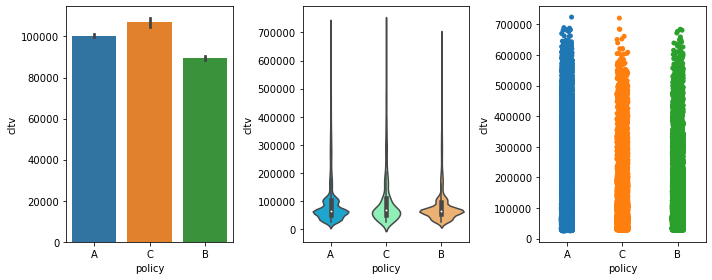

***Bivariate Analysis for :  type_of_policy vs cltv


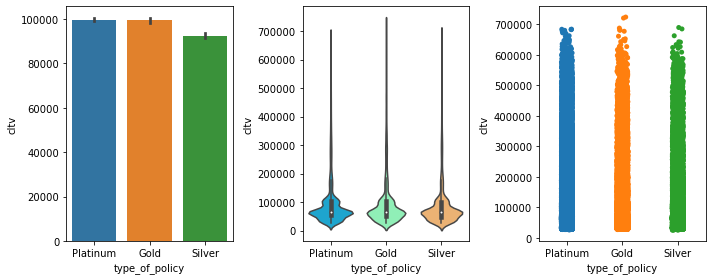

In [198]:
total_cat_cols = cat_cols + ord_cols

for col in total_cat_cols:
    print("***Bivariate Analysis for : ",col,"vs",tar_cols[0])
    cat_cols_bivariate_plot(train_df,col,tar_cols[0])

- Inference

    - gender vs cltv
        - Propotion of both male and female is more or less same for cltv
    - area vs cltv
        - Urban population have higher cltv than Rural
    - num_policies vs cltv
        - Population with only 1 policy have lower cltv than ones with multiple policies
    - marital_status vs cltv
        - Marital status dont have any dintinct impact on cltv
    - qualification vs cltv
        - High school and above qualification have higher cltv
    - vintage vs cltv
        - Higher cltv is returned for 3 years and 8 years old vintage customers
    - income vs cltv
        - Above 2 lakh income there is not differentiable impact on cltv
    - policy vs cltv
        - Dont observe any pattern or impact of policy on cltv
    - type_of_policy vs cltv
        - All policy type have almost equal propotion for cltv
        
Overall, We can conclude that Urban educated population with income > 2lakh and multiple policies have higher cltv.

#### Numerical vs Target variables

(0.0, 759030.0)

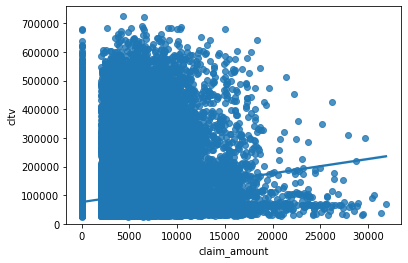

In [199]:
sns.regplot(x=num_cols[0],y=tar_cols[0],data=train_df)
plt.ylim(0,)

In [200]:
num_df = train_df[['claim_amount','cltv']]
num_df.columns

Index(['claim_amount', 'cltv'], dtype='object')

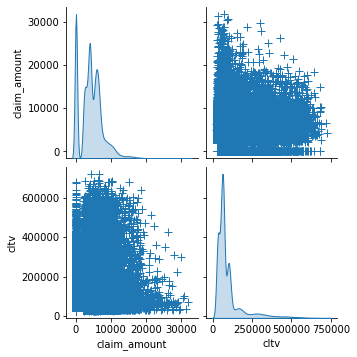

In [201]:
g = sns.pairplot(num_df, diag_kind="kde", markers="+",
                 plot_kws=dict(s=50, edgecolor="b", linewidth=1),
                 diag_kws=dict(shade=True))

In [202]:
num_df.corr()

,claim_amount,cltv
claim_amount,1.000000,0.180344
cltv,0.180344,1.000000


<AxesSubplot:>

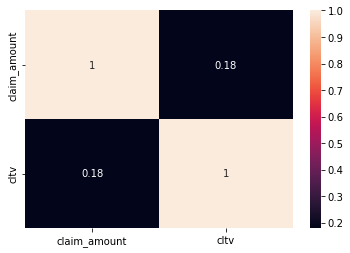

In [296]:
sns.heatmap(num_df.corr(),annot=True)

- Inference
    - claim_amount vs cltv:
        - Not linear in nature
        - Very little positive correlation

## Feature Engineering

### Outlier Treatment

In [210]:
num_cols = train_df.select_dtypes(include=np.number).drop(columns=['marital_status', 'vintage'],axis=1).columns.to_list()
num_cols

['claim_amount', 'cltv']

In [211]:
#create a histogram
for col in num_cols:
    fig = px.histogram(train_df, x=col)
    fig.show()

In [212]:
#create a box plot
for col in num_cols:
    fig = px.box(train_df, y=col)
    fig.show()

In [26]:
fig = px.scatter(x=train_df['claim_amount'], y=train_df['cltv'])
fig.show()

In [305]:
# Function to detect Outliers [Z score]
def detect_outliers_z_score(df):
    outliers = pd.DataFrame(columns=['Column','No. of Outlier'])
    cols = df.select_dtypes(include=np.number).columns.to_list()
    
    for c in cols:
        q1 = df[c].quantile(0.25)
        q3 = df[c].quantile(0.75)
        iqr = q3 - q1
        low_fence = df[c].mean() - 3*df[c].std()
        high_fence = df[c].mean() + 3*df[c].std()
        o = df[(df[c] < low_fence) | (df[c] > high_fence)].shape[0]

        outliers = outliers.append({'Column':c,'No. of Outlier':o},ignore_index=True)

    return outliers

Outliers_zscore = detect_outliers_z_score(train_df)
Outliers_zscore.set_index('Column',drop=True,inplace=True)
Outliers_zscore.sort_values(by='No. of Outlier',inplace=True)
Outliers_zscore.iloc[2:]

,No. of Outlier
Column,
claim_amount,1109
cltv,2700


<Figure size 360x144 with 0 Axes>

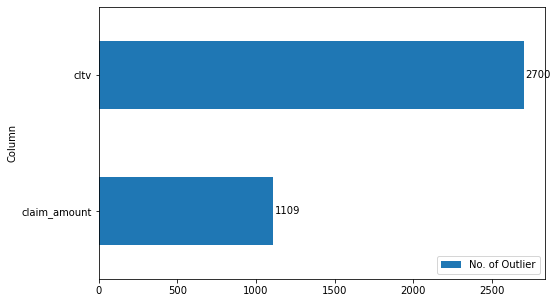

In [310]:
plt.figure(figsize=(5,2))
ax = Outliers_zscore.iloc[2:].plot(kind='barh',figsize=(8,5),legend=(3,3))
ax.bar_label(ax.containers[0],padding=2)
plt.legend(loc='lower right')
plt.show()

In [217]:
# Function to detect Outliers [IQR]
def detect_outliers_iqr(df):
    outliers = pd.DataFrame(columns=['Column','No. of Outlier'])
    cols = df.select_dtypes(include=np.number).columns.to_list()
    
    for c in cols:
        q1 = df[c].quantile(0.25)
        q3 = df[c].quantile(0.75)
        iqr = q3 - q1
        low_fence = q1 - (1.5*iqr)
        high_fence = q3 + (1.5*iqr)
        o = df[(df[c] < low_fence) | (df[c] > high_fence)].shape[0]

        outliers = outliers.append({'Column':c,'No. of Outlier':o},ignore_index=True)

    return outliers

Outliers_iqr = detect_outliers_iqr(train_df)
Outliers_iqr.set_index('Column',drop=True,inplace=True)
Outliers_iqr.sort_values(by='No. of Outlier',inplace=True)
Outliers_iqr

,No. of Outlier
Column,
marital_status,0
vintage,0
claim_amount,2258
cltv,10223


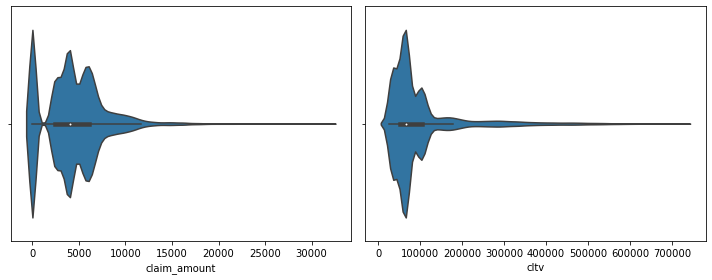

In [219]:
# plot violin plots
def plot_violin(dataframe):
    numeric_cols = dataframe.select_dtypes(include=np.number).drop(columns=['marital_status', 'vintage'],axis=1).columns.to_list()
    dataframe = dataframe[numeric_cols]
    
    for i in range(0,len(numeric_cols),2):
        if len(numeric_cols) > i+1:
            plt.figure(figsize=(10,4))
            plt.subplot(121)
            sns.violinplot(dataframe[numeric_cols[i]])
            plt.subplot(122)
            sns.violinplot(dataframe[numeric_cols[i+1]])
            plt.tight_layout()
            plt.show()
        else:
            sns.violinplot(dataframe[numeric_cols[i]])
            
plot_violin(train_df)

Treating outliers in the continuous columns
- Outliers can be treated in a variety of ways. It depends on the skewness of the feature.
- To reduce right skewness, we use roots or logarithms or reciprocals (roots are weakest). This is the most common problem in practice.
- To reduce left skewness, we take squares or cubes or higher powers.
- But in our data, some of the features have negative values and also the value 0. In such cases, square root transform or logarithmic transformation cannot be used since we cannot take square root of negative values and logarithm of zero is not defined.
- Hence for this data we use a method called Winsorization. In this method we define a confidence interval of let's say 90% and then replace all the outliers below the 5th percentile with the value at 5th percentile and all the values above 95th percentile with the value at the 95th percentile. It is pretty useful when there are negative values and zeros in the features which cannot be treated with log transforms or square roots. Do read up on it more here

Lets' write a function below that treats all the outliers in the numeric features using winsorization.

In [228]:
df1 = train_df.copy()
#function to treat outliers

def treat_outliers(dataframe):
    col = ['claim_amount','cltv']
    for col in cols:
#         lower_bound = dataframe[col].quantile(0.05)
#         upper_bound = dataframe[col].quantile(0.95)        
#         dataframe[col] = np.where(dataframe[col]>upper_bound,upper_bound,np.where(dataframe[col]<lower_bound,lower_bound,dataframe[col]))

        dataframe[col] = winsorize(dataframe[col], limits=[0.05, 0.1],inclusive=(True, True))
    
    return dataframe    

df1 = treat_outliers(df1)
print("***Before Outlier Treatment")
print(detect_outliers_z_score(train_df)) 
print("*"*80)
print("***After Outlier Treatment")
print(detect_outliers_z_score(df1)) 

***Before Outlier Treatment
           Column No. of Outlier
0  marital_status              0
1         vintage              0
2    claim_amount           1109
3            cltv           2700
********************************************************************************
***After Outlier Treatment
           Column No. of Outlier
0  marital_status              0
1         vintage              0
2    claim_amount              0
3            cltv              0


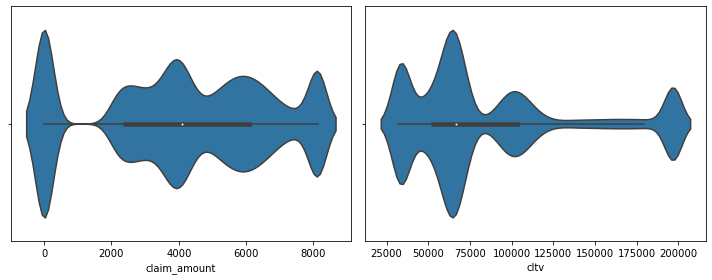

In [224]:
plot_violin(df1)

### Label Encoding

#### Encoding
Machine learning algorithms cannot work with categorical data directly, categorical data must be converted to number.
 1. Label Encoding
 2. One hot encoding
 3. Dummy variable trap

**Label encoding** refers to transforming the word labels into numerical form so that the algorithms can understand how to operate on them.

A **One hot encoding** is a representation of categorical variable as binary vectors.It allows the representation of categorical data to be more expresive. This first requires that the categorical values be mapped to integer values, that is label encoding. Then, each integer value is represented as a binary vector that is all zero values except the index of the integer, which is marked with a 1.

The **Dummy variable trap** is a scenario in which the independent variable are multicollinear, a scenario in which two or more variables are highly correlated in simple term one variable can be predicted from the others.

By using *pandas get_dummies* function we can do all above three step in line of code. We will this fuction  to get dummy variable for sex, children,smoker,region features. By setting *drop_first =True* function will remove dummy variable trap by droping one variable and original variable.The pandas makes our life easy.

In [229]:
categorical_columns = train_df.select_dtypes('object').columns.to_list()
categorical_columns

['gender',
 'area',
 'qualification',
 'income',
 'num_policies',
 'policy',
 'type_of_policy']

In [230]:
# check categorical values in each column
for col in categorical_columns:
    print("***",col)
    print(train_df[col].unique())

*** gender
['Male' 'Female']
*** area
['Urban' 'Rural']
*** qualification
['Bachelor' 'High School' 'Others']
*** income
['5L-10L' 'More than 10L' '2L-5L' '<=2L']
*** num_policies
['More than 1' '1']
*** policy
['A' 'C' 'B']
*** type_of_policy
['Platinum' 'Gold' 'Silver']


In [231]:
# One hot encoding of categorical columns
train_df_encode = pd.get_dummies(data = train_df, prefix = 'OHE', prefix_sep='_',
               columns = categorical_columns,
               drop_first =True,
              dtype='int8')

In [232]:
# Lets verify the dummay variable process
print('Columns in original data frame:\n',train_df.columns.values)
print('\nNumber of rows and columns in the dataset:',train_df.shape)
print('\nColumns in data frame after encoding dummy variable:\n',train_df_encode.columns.values)
print('\nNumber of rows and columns in the dataset:',train_df_encode.shape)

Columns in original data frame:
 ['gender' 'area' 'qualification' 'income' 'marital_status' 'vintage'
 'claim_amount' 'num_policies' 'policy' 'type_of_policy' 'cltv']

Number of rows and columns in the dataset: (89392, 11)

Columns in data frame after encoding dummy variable:
 ['marital_status' 'vintage' 'claim_amount' 'cltv' 'OHE_Male' 'OHE_Urban'
 'OHE_High School' 'OHE_Others' 'OHE_5L-10L' 'OHE_<=2L'
 'OHE_More than 10L' 'OHE_More than 1' 'OHE_B' 'OHE_C' 'OHE_Platinum'
 'OHE_Silver']

Number of rows and columns in the dataset: (89392, 16)


In [233]:
# Removing unwanted charcaters like "<," from the column names
train_df_encode.rename(columns={'OHE_High School':'OHE_High_School',
'OHE_5L-10L':'OHE_5L_to_10L',
'OHE_<=2L':'OHE_less_than_2L',
'OHE_More than 10L':'OHE_More_than_10L',
'OHE_More than 1':'OHE_More_than_1'},inplace=True)
train_df_encode.columns

Index(['marital_status', 'vintage', 'claim_amount', 'cltv', 'OHE_Male',
       'OHE_Urban', 'OHE_High_School', 'OHE_Others', 'OHE_5L_to_10L',
       'OHE_less_than_2L', 'OHE_More_than_10L', 'OHE_More_than_1', 'OHE_B',
       'OHE_C', 'OHE_Platinum', 'OHE_Silver'],
      dtype='object')

In [234]:
train_df_encode.dtypes

marital_status       int64
vintage              int64
claim_amount         int64
cltv                 int64
OHE_Male              int8
OHE_Urban             int8
OHE_High_School       int8
OHE_Others            int8
OHE_5L_to_10L         int8
OHE_less_than_2L      int8
OHE_More_than_10L     int8
OHE_More_than_1       int8
OHE_B                 int8
OHE_C                 int8
OHE_Platinum          int8
OHE_Silver            int8
dtype: object

In [235]:
# Applying same label encoding on outlier treated df
categorical_columns = df1.select_dtypes('object').columns.to_list()
df1_encode = pd.get_dummies(data = df1, prefix = 'OHE', prefix_sep='_',
               columns = categorical_columns,
               drop_first =True,
              dtype='int8')

df1_encode.rename(columns={'OHE_High School':'OHE_High_School',
'OHE_5L-10L':'OHE_5L_to_10L',
'OHE_<=2L':'OHE_less_than_2L',
'OHE_More than 10L':'OHE_More_than_10L',
'OHE_More than 1':'OHE_More_than_1'},inplace=True)

df1_encode.dtypes

marital_status       int64
vintage              int64
claim_amount         int64
cltv                 int64
OHE_Male              int8
OHE_Urban             int8
OHE_High_School       int8
OHE_Others            int8
OHE_5L_to_10L         int8
OHE_less_than_2L      int8
OHE_More_than_10L     int8
OHE_More_than_1       int8
OHE_B                 int8
OHE_C                 int8
OHE_Platinum          int8
OHE_Silver            int8
dtype: object

### Feature Scaling

In [237]:
mms = MinMaxScaler()

In [239]:
train_df_scaled = train_df_encode.copy()
train_df_scaled.head()

,marital_status,vintage,claim_amount,cltv,OHE_Male,OHE_Urban,OHE_High_School,OHE_Others,OHE_5L_to_10L,OHE_less_than_2L,OHE_More_than_10L,OHE_More_than_1,OHE_B,OHE_C,OHE_Platinum,OHE_Silver
0,1,5,5790,64308,1,1,0,0,1,0,0,1,0,0,1,0
1,0,8,5080,515400,1,0,1,0,1,0,0,1,0,0,1,0
2,1,8,2599,64212,1,1,0,0,1,0,0,1,0,0,1,0
3,0,7,0,97920,0,0,1,0,1,0,0,1,0,0,1,0
4,1,6,3508,59736,1,1,1,0,0,0,1,1,0,0,0,0


In [240]:
train_df_scaled[['claim_amount']] = mms.fit_transform(train_df_scaled[['claim_amount']])

In [241]:
train_df_scaled.head()

,marital_status,vintage,claim_amount,cltv,OHE_Male,OHE_Urban,OHE_High_School,OHE_Others,OHE_5L_to_10L,OHE_less_than_2L,OHE_More_than_10L,OHE_More_than_1,OHE_B,OHE_C,OHE_Platinum,OHE_Silver
0,1,5,0.181539,64308,1,1,0,0,1,0,0,1,0,0,1,0
1,0,8,0.159278,515400,1,0,1,0,1,0,0,1,0,0,1,0
2,1,8,0.081489,64212,1,1,0,0,1,0,0,1,0,0,1,0
3,0,7,0.000000,97920,0,0,1,0,1,0,0,1,0,0,1,0
4,1,6,0.109989,59736,1,1,1,0,0,0,1,1,0,0,0,0


In [242]:
# Applying same scaling on outlier treated df
df1_scaled = df1_encode.copy()
df1_scaled[['claim_amount']] = mms.fit_transform(df1_scaled[['claim_amount']])
df1_scaled.head()

,marital_status,vintage,claim_amount,cltv,OHE_Male,OHE_Urban,OHE_High_School,OHE_Others,OHE_5L_to_10L,OHE_less_than_2L,OHE_More_than_10L,OHE_More_than_1,OHE_B,OHE_C,OHE_Platinum,OHE_Silver
0,1,5,0.712966,64308,1,1,0,0,1,0,0,1,0,0,1,0
1,0,7,0.625539,196980,1,0,1,0,1,0,0,1,0,0,1,0
2,1,7,0.320034,64212,1,1,0,0,1,0,0,1,0,0,1,0
3,0,7,0.000000,97920,0,0,1,0,1,0,0,1,0,0,1,0
4,1,6,0.431967,59736,1,1,1,0,0,0,1,1,0,0,0,0


## Model Building

### Train Test Split

In [243]:
X = train_df_encode.drop(columns='cltv',axis=1) #Independent Variables
y = train_df_encode['cltv'] #Dependent Variable

In [250]:
# for outlier treated df
X_out = df1_scaled.drop(columns='cltv',axis=1) #Independent Variables
y_out = df1_scaled['cltv'] #Dependent Variable

### Model Building

#### ML Models -- [Linear Reg, Lasso, Decision Tree, Random Forest, Adaboost, XGboost]

In [245]:
# Creating a function for Model Building and selection
def find_best_model(X,y):
    models = {
        'linear_regression' : {
            'model' : LinearRegression()
        },
        'lasso' : {
            'model' : Lasso()
        },
        'decision_tree' : {
            'model' : DecisionTreeRegressor()
        },
        'random_forest' : {
            'model' : RandomForestRegressor()
        },
        'adaboost' : {
            'model' : AdaBoostRegressor()
        },
        'xgboost' : {
            'model' : XGBRegressor()
        }
    }
    
    scores = []
    X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3,random_state=42)
    
    for model_name, model_params in models.items():
        reg_model = model_params['model'].fit(X_train,y_train)
        y_test_predict = reg_model.predict(X_test)
        y_train_predict = reg_model.predict(X_train)
        test_score = r2_score(y_test,y_test_predict)
        train_score = r2_score(y_train,y_train_predict)
        scores.append({
            'model': model_name,
            'Train_score' : train_score,
            'Test_score' : test_score
        })
        
    return pd.DataFrame(scores,columns=['model','Train_score','Test_score'])

#### Deep Learning Model [ANN]

In [160]:
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras import Model
from tensorflow.keras import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.losses import MeanSquaredLogarithmicError

In [161]:
hidden_units1 = 160
hidden_units2 = 480
hidden_units3 = 256
learning_rate = 0.01
# Creating model using the Sequential in tensorflow
def build_model_using_sequential():
  model = Sequential([
    Dense(hidden_units1, kernel_initializer='normal', activation='relu'),
    Dropout(0.2),
    Dense(hidden_units2, kernel_initializer='normal', activation='relu'),
    Dropout(0.2),
    Dense(hidden_units3, kernel_initializer='normal', activation='relu'),
    Dense(1, kernel_initializer='normal', activation='linear')
  ])
  return model
# build the model
model = build_model_using_sequential()

In [163]:
# loss function
msle = MeanSquaredLogarithmicError()
model.compile(
    loss=msle, 
    optimizer=Adam(learning_rate=learning_rate), 
    metrics=[msle]
)
# train the model
history = model.fit(
    X_out_scaled.values, 
    y_out.values, 
    epochs=50, 
    batch_size=64,
    validation_split=0.2
)

Epoch 1/50
1118/1118 [==============================] - 9s 7ms/step - loss: 0.1923 - mean_squared_logarithmic_error: 0.1923 - val_loss: 0.1847 - val_mean_squared_logarithmic_error: 0.1846
Epoch 2/50
1118/1118 [==============================] - 8s 7ms/step - loss: 0.1920 - mean_squared_logarithmic_error: 0.1920 - val_loss: 0.1885 - val_mean_squared_logarithmic_error: 0.1885
Epoch 3/50
1118/1118 [==============================] - 8s 7ms/step - loss: 0.1921 - mean_squared_logarithmic_error: 0.1921 - val_loss: 0.1873 - val_mean_squared_logarithmic_error: 0.1874
Epoch 4/50
1118/1118 [==============================] - 9s 8ms/step - loss: 0.1921 - mean_squared_logarithmic_error: 0.1922 - val_loss: 0.1833 - val_mean_squared_logarithmic_error: 0.1834
Epoch 5/50
1118/1118 [==============================] - 9s 8ms/step - loss: 0.1911 - mean_squared_logarithmic_error: 0.1911 - val_loss: 0.1832 - val_mean_squared_logarithmic_error: 0.1832
Epoch 6/50
1118/1118 [==============================] - 8s 7

1118/1118 [==============================] - 9s 8ms/step - loss: 0.1891 - mean_squared_logarithmic_error: 0.1891 - val_loss: 0.1818 - val_mean_squared_logarithmic_error: 0.1818
Epoch 45/50
1118/1118 [==============================] - 9s 8ms/step - loss: 0.1891 - mean_squared_logarithmic_error: 0.1891 - val_loss: 0.1836 - val_mean_squared_logarithmic_error: 0.1836
Epoch 46/50
1118/1118 [==============================] - 8s 7ms/step - loss: 0.1894 - mean_squared_logarithmic_error: 0.1894 - val_loss: 0.1820 - val_mean_squared_logarithmic_error: 0.1820
Epoch 47/50
1118/1118 [==============================] - 9s 8ms/step - loss: 0.1890 - mean_squared_logarithmic_error: 0.1890 - val_loss: 0.1835 - val_mean_squared_logarithmic_error: 0.1835
Epoch 48/50
1118/1118 [==============================] - 9s 8ms/step - loss: 0.1891 - mean_squared_logarithmic_error: 0.1891 - val_loss: 0.1818 - val_mean_squared_logarithmic_error: 0.1817
Epoch 49/50
1118/1118 [==============================] - 8s 8ms/ste

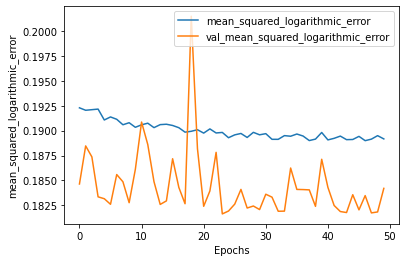

In [164]:
def plot_history(history, key):
  plt.plot(history.history[key])
  plt.plot(history.history['val_'+key])
  plt.xlabel("Epochs")
  plt.ylabel(key)
  plt.legend([key, 'val_'+key])
  plt.show()
# Plot the history
plot_history(history, 'mean_squared_logarithmic_error')

#### Model Evaluation

In [249]:
# Model Evaluation on Without outlier treated data
find_best_model(X, y)

,model,Train_score,Test_score
0,linear_regression,0.152002,0.152278
1,lasso,0.152002,0.152279
2,decision_tree,0.947968,-0.770809
3,random_forest,0.824541,0.037662
4,adaboost,0.030263,0.025344
5,xgboost,0.273579,0.137706


In [251]:
# Model Evaluation on with outlier treated data
find_best_model(X_out, y_out)

,model,Train_score,Test_score
0,linear_regression,0.259128,0.262893
1,lasso,0.259128,0.262892
2,decision_tree,0.863183,-0.374205
3,random_forest,0.773378,0.158930
4,adaboost,0.235907,0.238607
5,xgboost,0.357008,0.252353


- Best Model ***[XGBoost]*** with outlier removed.
    - Train R2_score = 0.357008
    - Test R2_score = 0.252353	

#### Final Model

In [252]:
X = df1_scaled.drop(columns='cltv',axis=1) #Independent Variables
y = df1_scaled['cltv'] #Dependent Variable

In [253]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3,random_state=42)

In [259]:
model = XGBRegressor()
model.fit(X_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.300000012, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=6, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, ...)

## Model Evaluation

In [260]:
y_test_predict = model.predict(X_test)
y_train_predict = model.predict(X_train)
test_score = r2_score(y_test,y_test_predict)
train_score = r2_score(y_train,y_train_predict)

In [261]:
def evaluation(ya,yp):
    mse = mean_squared_error(ya,yp)
    print("MSE: ",mse)
    print("*"*80)
    rmse = np.sqrt(mse)
    print("RMSE: ",rmse)
    print("*"*80)
    mae = mean_absolute_error(ya,yp)
    print("MAE: ",mae)
    print("*"*80)
    score = r2_score(ya,yp)
    print("R2 Score: ",score)

In [262]:
print("Training Data Evaluation")
print("*"*80)
evaluation(y_train,y_train_predict)

Training Data Evaluation
********************************************************************************
MSE:  1606589170.6593945
********************************************************************************
RMSE:  40082.28000824547
********************************************************************************
MAE:  30222.478067655396
********************************************************************************
R2 Score:  0.3570082631141176


In [263]:
print("Testing Data Evaluation")
print("*"*80)
evaluation(y_test,y_test_predict)

Testing Data Evaluation
********************************************************************************
MSE:  1844593891.035407
********************************************************************************
RMSE:  42948.73561626008
********************************************************************************
MAE:  32340.027679563984
********************************************************************************
R2 Score:  0.2523531052179504


## Model Testing

In [273]:
test_df = pd.read_csv('Data/test_koRSKBP.csv')
test_df.head()

,id,gender,area,qualification,income,marital_status,vintage,claim_amount,num_policies,policy,type_of_policy
0,89393,Female,Rural,High School,5L-10L,0,6,2134,More than 1,B,Silver
1,89394,Female,Urban,High School,2L-5L,0,4,4102,More than 1,A,Platinum
2,89395,Male,Rural,High School,5L-10L,1,7,2925,More than 1,B,Gold
3,89396,Female,Rural,Bachelor,More than 10L,1,2,0,More than 1,B,Silver
4,89397,Female,Urban,High School,2L-5L,0,5,14059,More than 1,B,Silver


In [274]:
# Preprocessing test data
test_df_copy = test_df.copy()

test_df_copy.drop(columns=['id'],axis=1,inplace=True)

categorical_columns = test_df_copy.select_dtypes('object').columns.to_list()
test_df_encode = pd.get_dummies(data = test_df_copy, prefix = 'OHE', prefix_sep='_',
               columns = categorical_columns,
               drop_first =True,
              dtype='int8')

test_df_encode.rename(columns={'OHE_High School':'OHE_High_School',
'OHE_5L-10L':'OHE_5L_to_10L',
'OHE_<=2L':'OHE_less_than_2L',
'OHE_More than 10L':'OHE_More_than_10L',
'OHE_More than 1':'OHE_More_than_1'},inplace=True)

test_df_encode[['claim_amount']] = mms.transform(test_df_encode[['claim_amount']])

test_df_encode.head()

,marital_status,vintage,claim_amount,OHE_Male,OHE_Urban,OHE_High_School,OHE_Others,OHE_5L_to_10L,OHE_less_than_2L,OHE_More_than_10L,OHE_More_than_1,OHE_B,OHE_C,OHE_Platinum,OHE_Silver
0,0,6,0.262776,0,0,1,0,1,0,0,1,1,0,0,1
1,0,4,0.505110,0,1,1,0,0,0,0,1,0,0,1,0
2,1,7,0.360177,1,0,1,0,1,0,0,1,1,0,0,0
3,1,2,0.000000,0,0,0,0,0,0,1,1,1,0,0,1
4,0,5,1.731191,0,1,1,0,0,0,0,1,1,0,0,1


In [275]:
# predicting
Test_Prediction = model.predict(test_df_encode)

In [276]:
Test_Prediction[0:5]

array([ 69654.984, 104929.28 ,  79345.234,  83701.96 , 113480.44 ],
      dtype=float32)

In [283]:
np.around(Test_Prediction,2)[0:5]

array([ 69654.98, 104929.28,  79345.24,  83701.96, 113480.44],
      dtype=float32)

In [289]:
df1 = test_df.copy()
df1['cltv']=np.around(Test_Prediction,2)

df1.head()

,id,gender,area,qualification,income,marital_status,vintage,claim_amount,num_policies,policy,type_of_policy,cltv
0,89393,Female,Rural,High School,5L-10L,0,6,2134,More than 1,B,Silver,69654.976562
1,89394,Female,Urban,High School,2L-5L,0,4,4102,More than 1,A,Platinum,104929.281250
2,89395,Male,Rural,High School,5L-10L,1,7,2925,More than 1,B,Gold,79345.242188
3,89396,Female,Rural,Bachelor,More than 10L,1,2,0,More than 1,B,Silver,83701.960938
4,89397,Female,Urban,High School,2L-5L,0,5,14059,More than 1,B,Silver,113480.437500


In [290]:
df1[['id','cltv']]

,id,cltv
0,89393,69654.976562
1,89394,104929.281250
2,89395,79345.242188
3,89396,83701.960938
4,89397,113480.437500
...,...,...
59590,148983,45826.519531
59591,148984,44928.589844
59592,148985,88461.500000
59593,148986,89404.500000


In [292]:
#creating the sample submission file
sample_submission = df1[['id','cltv']]
sample_submission.to_csv("sample_submission.csv",index=False)